# Algoritmo para dividir nuestra base de datos en "train" y "test"

In [ ]:
# Definir el porcentaje de imágenes utilizadas para test
test_percent = 0.2

# Definir los paths a la base de datos, al directorio train y test
dataset_path = './dataset/original/'
train_path = './dataset/train/'
test_path = './dataset/test/'

# Eliminar las carpetas train y test si ya existen
if os.path.exists(train_path):
    shutil.rmtree(train_path)
if os.path.exists(test_path):
    shutil.rmtree(test_path)

# Crear las carpetas train y test
os.makedirs(train_path)
os.makedirs(test_path)

# Obtener todas las carpetas en el directorio dataset_path
folders = [folder for folder in os.listdir(dataset_path) if os.path.isdir(os.path.join(dataset_path, folder))]

# Para cada carpeta, crear subcarpetas en train y test y mover las imágenes
for folder in folders:
    folder_path = os.path.join(dataset_path, folder)
    image_files = [os.path.join(folder_path, file) for file in os.listdir(folder_path) if file.endswith(('.jpg', '.jpeg', '.png', '.gif', '.bmp'))]
    
    # Mezclar aleatoriamente la lista de imágenes
    random.shuffle(image_files)
    
    # Calcular cuántas imágenes se deben mover a la carpeta de prueba
    num_test_images = int(len(image_files) * test_percent)
    
    # Dividir la lista en imágenes de entrenamiento y prueba
    test_images = image_files[:num_test_images]
    train_images = image_files[num_test_images:]
    
    # Mover las imágenes a las carpetas correspondientes
    for image in test_images:
        dest_path = os.path.join(test_path, folder)
        os.makedirs(dest_path, exist_ok=True)
        shutil.copy(image, dest_path)
    
    for image in train_images:
        dest_path = os.path.join(train_path, folder)
        os.makedirs(dest_path, exist_ok=True)
        shutil.copy(image, dest_path)

"# Definir el porcentaje de imágenes utilizadas para test\ntest_percent = 0.2\n\n# Definir los paths a la base de datos, al directorio train y test\ndataset_path = './dataset/original/'\ntrain_path = './dataset/train/'\ntest_path = './dataset/test/'\n\n# Eliminar las carpetas train y test si ya existen\nif os.path.exists(train_path):\n    shutil.rmtree(train_path)\nif os.path.exists(test_path):\n    shutil.rmtree(test_path)\n\n# Crear las carpetas train y test\nos.makedirs(train_path)\nos.makedirs(test_path)\n\n# Obtener todas las carpetas en el directorio dataset_path\nfolders = [folder for folder in os.listdir(dataset_path) if os.path.isdir(os.path.join(dataset_path, folder))]\n\n# Para cada carpeta, crear subcarpetas en train y test y mover las imágenes\nfor folder in folders:\n    folder_path = os.path.join(dataset_path, folder)\n    image_files = [os.path.join(folder_path, file) for file in os.listdir(folder_path) if file.endswith(('.jpg', '.jpeg', '.png', '.gif', '.bmp'))]\n    \

# OLD HARALICK CLASSIFIER

[INFO] Obteniendo las características de textura...
[INFO] Entrenando el modelo...
[INFO] Clasificando...


/home/adrian/.virtualenvs/VAA/lib/python3.8/site-packages/sklearn/svm/_classes.py:32: FutureWarning: The default value of `dual` will change from `True` to `'auto'` in 1.5. Set the value of `dual` explicitly to suppress the warning.
  warnings.warn(


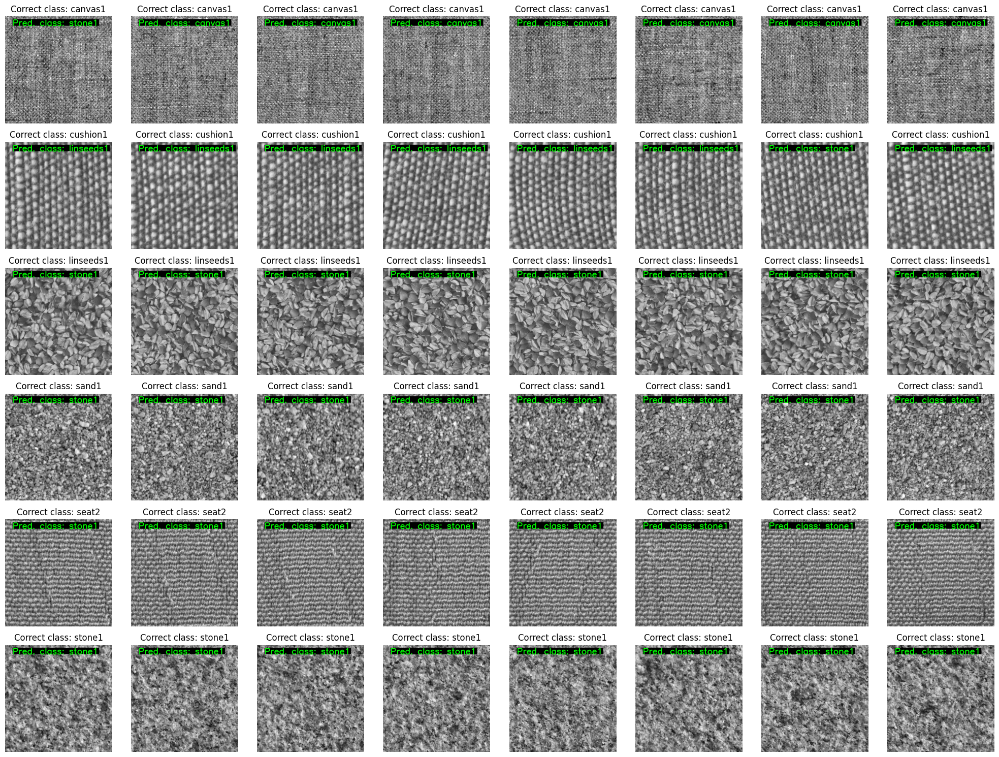

In [1]:
# DO NOT USE DO NOT USE DO NOT USE DO NOT USE DO NOT USE DO NOT USE DO NOT USE DO NOT USE DO NOT USE DO NOT USE DO NOT USE DO NOT USE DO NOT USE DO NOT USE

import warnings
warnings.filterwarnings("ignore", category=UserWarning)

import cv2
import numpy as np
import matplotlib
matplotlib.use('TkAgg')
%matplotlib inline
import matplotlib.pyplot as plt
import os
import random
import shutil
import mahotas
import pandas as pd
import csv
from sklearn.svm import LinearSVC
from sklearn.preprocessing import MinMaxScaler


# Definir los paths al directorio train y test
train_path = './dataset/train/'
test_path = './dataset/test/'

print("[INFO] Obteniendo las características de textura...")
# Inicializamos la matriz de datos y la lista de etiquetas
data = []
labels = []

# Recorremos las imágenes de entrenamiento
for folderName in os.listdir(train_path):
    for imageName in os.listdir(train_path+folderName):
        # Definir el path a la imagen actual
        image_path = train_path+folderName+'/'+imageName

        # Cargamos la imagen, la convertimos a gris y extraemos el nombre de la textura a partir del nombre del fichero
        image = cv2.imread(image_path)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
        texture = image_path[image_path.rfind("/") + 1:].split("_")[0].split("-")[0]

        # Extraemos las características de Haralick en 4 direcciones, luego tomamos la media de cada dirección
        features = mahotas.features.haralick(image).mean(axis=0)

        # Actualizamos los datos y las etiquetas
        data.append(features)
        labels.append(texture)

# Creamos un DataFrame para los datos y las etiquetas
dataset = pd.DataFrame(data=np.array(data), columns=[f'feature_{i}' for i in range(len(data[0]))])
dataset['texture'] = labels

# Guardamos el DataFrame en un archivo CSV
dataset.to_csv("Haralick_features.csv", index=False)




print("[INFO] Entrenando el modelo...")
# Entrenamos el clasificador
HaralickByLinearModel = LinearSVC(C=10.0, random_state=42)
HaralickByLinearModel.fit(data, labels)




print("[INFO] Clasificando...")
# Contar el número de clases y el número de imágenes por clase
num_classes = len(os.listdir(test_path))
num_images_per_class = len(os.listdir(os.path.join(test_path, os.listdir(test_path)[0])))

# Crear el subplot
fig, axs = plt.subplots(num_classes, num_images_per_class, figsize=(20, 15))

# Recorrer las imágenes de prueba y mostrarlas en el subplot
for i, folderName in enumerate(sorted(os.listdir(test_path))):
    class_images = []
    for j, imageName in enumerate(sorted(os.listdir(os.path.join(test_path, folderName)))):
        # Definir el path a la imagen actual
        image_path = os.path.join(test_path, folderName, imageName)

        # Cargamos la imagen, la convertimos a gris y extraemos el descriptor de Haralick de cada imagen de prueba
        image = cv2.imread(image_path)
        gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
        features = mahotas.features.haralick(gray).mean(axis=0)

        # Clasificamos la imagen de prueba
        pred = HaralickByLinearModel.predict(features.reshape(1, -1))[0]
        pred_text = "Pred. class: " + pred  # Utilizando el diccionario inverso para pasar de número a texto de clase

        # Obtener el tamaño del texto
        text_size = cv2.getTextSize(pred_text, cv2.FONT_HERSHEY_SIMPLEX, 1.5, 3)[0]

        # Calcular la posición del rectángulo de fondo
        background_coords = ((40, 50 - text_size[1]), (40 + text_size[0], 50))

        # Dibujar el rectángulo de fondo
        cv2.rectangle(image, background_coords[0], background_coords[1], (0, 0, 0), -1)

        # Agregar el texto con la predicción
        cv2.putText(image, pred_text, (40, 50), cv2.FONT_HERSHEY_SIMPLEX, 1.5, (0, 255, 0), 3)

        # Añadir la imagen clasificada a la lista de imágenes de su clase
        class_images.append(image)

    # Mostrar las imágenes de la clase actual en una fila del subplot
    for j in range(num_images_per_class):
        axs[i, j].imshow(cv2.cvtColor(class_images[j], cv2.COLOR_BGR2RGB))
        axs[i, j].set_title("Correct class: " + folderName)
        axs[i, j].axis('off')

plt.tight_layout()
plt.show()

# DO NOT USE DO NOT USE DO NOT USE DO NOT USE DO NOT USE DO NOT USE DO NOT USE DO NOT USE DO NOT USE DO NOT USE 

## TRY 2 (MODIFIED)

[INFO] Obteniendo las características de textura...
[INFO] Entrenando el modelo...
[INFO] Clasificando...


/home/adrian/.virtualenvs/VAA/lib/python3.8/site-packages/sklearn/svm/_classes.py:32: FutureWarning: The default value of `dual` will change from `True` to `'auto'` in 1.5. Set the value of `dual` explicitly to suppress the warning.
  warnings.warn(


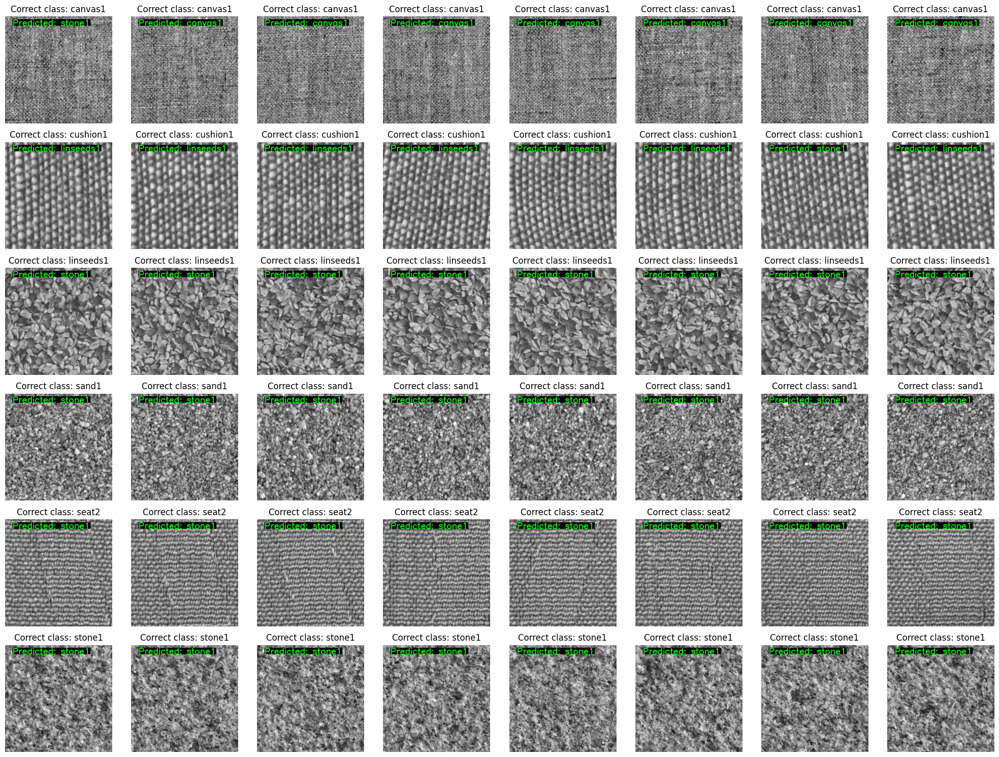

In [1]:
# DO NOT USE DO NOT USE DO NOT USE DO NOT USE DO NOT USE DO NOT USE DO NOT USE DO NOT USE DO NOT USE DO NOT USE DO NOT USE DO NOT USE DO NOT USE DO NOT USE

import warnings
warnings.filterwarnings("ignore", category=UserWarning)

import cv2
import numpy as np
import matplotlib
matplotlib.use('TkAgg')
%matplotlib inline
import matplotlib.pyplot as plt
import os
import random
import shutil
import mahotas
import pandas as pd
import csv
from sklearn.svm import LinearSVC
from sklearn.preprocessing import MinMaxScaler


# Definir los paths al directorio train y test
train_path = './dataset/train/'
test_path = './dataset/test/'

# Diccionario para mapear clases de textura a números
texture_mapping = {'canvas1': 0.0, 'cushion1': 1.0, 'linseeds1': 2.0, 'sand1': 3.0, 'seat2': 4.0, 'stone1': 5.0}

# Diccionario inverso para mapear los números a las etiquetas de texto originales
inverse_texture_mapping = {0.0: 'canvas1', 1.0: 'cushion1', 2.0: 'linseeds1', 3.0: 'sand1', 4.0: 'seat2', 5.0: 'stone1'}

print("[INFO] Obteniendo las características de textura...")
# Inicializamos la matriz de datos y la lista de etiquetas
data = []
labels = []

# Recorremos las imágenes de entrenamiento
for folderName in os.listdir(train_path):
    for imageName in os.listdir(train_path+folderName):
        # Definir el path a la imagen actual
        image_path = train_path+folderName+'/'+imageName

        # Cargamos la imagen, la convertimos a gris y extraemos el nombre de la textura a partir del nombre del fichero
        image = cv2.imread(image_path)
        gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
        texture = image_path[image_path.rfind("/") + 1:].split("_")[0].split("-")[0]

        # Mapeamos la textura a su número asociado
        label = texture_mapping.get(texture, -1)  # -1 si la textura no está mapeada

        # Si la textura está mapeada, calculamos las características de Haralick
        if label != -1:
            # Obtenemos las características de Haralick de la imagen
            features = mahotas.features.haralick(gray).mean(axis=0)

            # Actualizamos los datos y las etiquetas
            data.append(features)
            labels.append(label)

# Creamos un DataFrame para los datos y las etiquetas
dataset = pd.DataFrame(data=np.array(data), columns=[f'feature_{i}' for i in range(len(data[0]))])
dataset['texture'] = labels

# Guardamos el DataFrame en un archivo CSV
dataset.to_csv("Haralick_features.csv", index=False)





def load_data(path, array=True):
    train = pd.read_csv(path)
    if array:
        train = train.to_numpy()
    return train

# Cargamos el CSV con las características
rawData = load_data('./Haralick_features.csv')  # SI SE UTILIZA "rawData" PASAR SOLO LOS FEATURES A .fit (SIN LA COLUMNA LABEL)

print("[INFO] Entrenando el modelo...")
# Entrenamos el clasificador
HaralickByLinearModel = LinearSVC(C=10.0, random_state=42)
HaralickByLinearModel.fit(data, labels)




print("[INFO] Clasificando...")
# Contar el número de clases y el número de imágenes por clase
num_classes = len(os.listdir(test_path))
num_images_per_class = len(os.listdir(os.path.join(test_path, os.listdir(test_path)[0])))

# Crear el subplot
fig, axs = plt.subplots(num_classes, num_images_per_class, figsize=(20, 15))

# Recorrer las imágenes de prueba y mostrarlas en el subplot
for i, folderName in enumerate(sorted(os.listdir(test_path))):
    class_images = []
    for j, imageName in enumerate(sorted(os.listdir(os.path.join(test_path, folderName)))):
        # Definir el path a la imagen actual
        image_path = os.path.join(test_path, folderName, imageName)

        # Cargamos la imagen, la convertimos a gris y extraemos el descriptor de Haralick de cada imagen de prueba
        image = cv2.imread(image_path)
        gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
        features = mahotas.features.haralick(gray).mean(axis=0)

        # Clasificamos la imagen de prueba
        pred = HaralickByLinearModel.predict(features.reshape(1, -1))
        pred_text = "Predicted: " + inverse_texture_mapping[pred[0]]  # Utilizando el diccionario inverso para pasar de número a texto de clase

        # Obtener el tamaño del texto
        text_size = cv2.getTextSize(pred_text, cv2.FONT_HERSHEY_SIMPLEX, 1.5, 3)[0]

        # Calcular la posición del rectángulo de fondo
        background_coords = ((40, 50 - text_size[1]), (40 + text_size[0], 50))

        # Dibujar el rectángulo de fondo
        cv2.rectangle(image, background_coords[0], background_coords[1], (0, 0, 0), -1)

        # Agregar el texto con la predicción
        cv2.putText(image, pred_text, (40, 50), cv2.FONT_HERSHEY_SIMPLEX, 1.5, (0, 255, 0), 3)

        # Añadir la imagen clasificada a la lista de imágenes de su clase
        class_images.append(image)

    # Mostrar las imágenes de la clase actual en una fila del subplot
    for j in range(num_images_per_class):
        axs[i, j].imshow(cv2.cvtColor(class_images[j], cv2.COLOR_BGR2RGB))
        axs[i, j].set_title("Correct class: " + folderName)
        axs[i, j].axis('off')

plt.tight_layout()
plt.show()

# DO NOT USE DO NOT USE DO NOT USE DO NOT USE DO NOT USE DO NOT USE DO NOT USE DO NOT USE DO NOT USE DO NOT USE 

# OLD LBP

[INFO] Obteniendo las características de textura...
[INFO] Entrenando el modelo...
[INFO] Clasificando...


/home/adrian/Escritorio/Vision_Artificial/Practicas/P5/TRASH/BayesianoLineal.py:86: RuntimeWarning: divide by zero encountered in log
  return -0.5 * Xm_covariance_sum - 0.5 * np.log(cov_matrix_det) + np.log(self.priors[index])


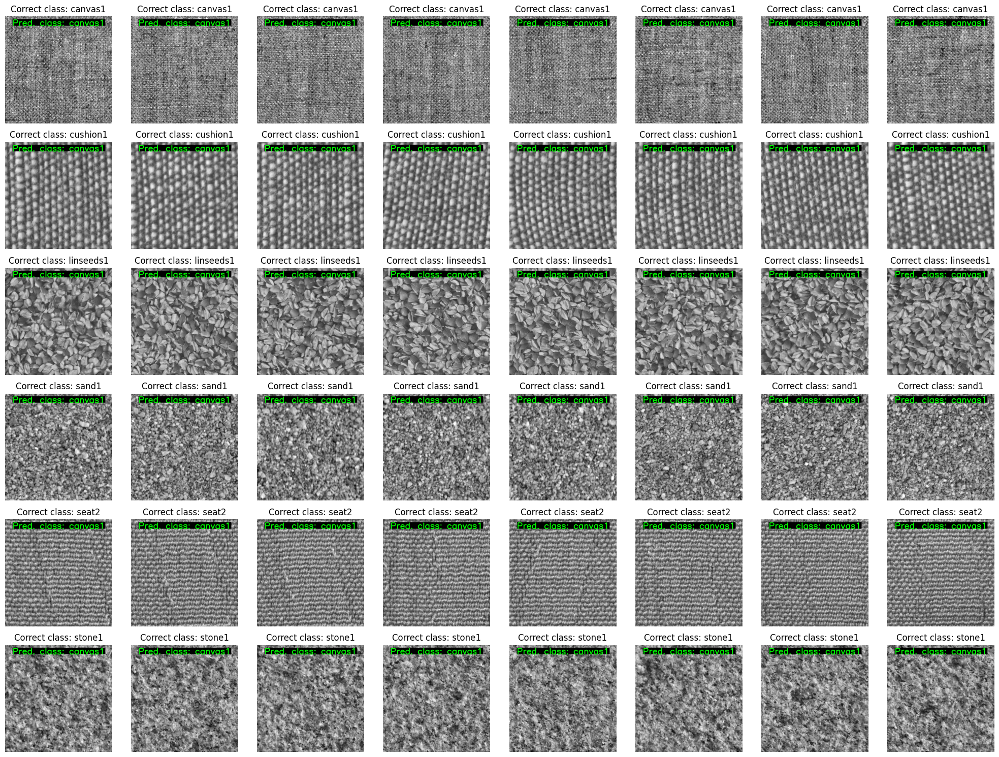

In [5]:
import warnings
warnings.filterwarnings("ignore", category=UserWarning)

import cv2
import numpy as np
import matplotlib
matplotlib.use('TkAgg')
%matplotlib inline
import matplotlib.pyplot as plt
import os
import random
import shutil
import mahotas
import pandas as pd
import csv
from BayesianoLineal import ByLinear, Data
from Mahalanobis import Mahalanobis
from sklearn.svm import LinearSVC
from sklearn.preprocessing import MinMaxScaler






# Definir los paths al directorio train y test
train_path = './dataset/train/'
test_path = './dataset/test/'

# Diccionario para mapear clases de textura a números
texture_mapping = {'canvas1': 0, 'cushion1': 1, 'linseeds1': 2, 'sand1': 3, 'seat2': 4, 'stone1': 5}

# Diccionario inverso para mapear los números a las etiquetas de texto originales
inverse_texture_mapping = {0: 'canvas1', 1: 'cushion1', 2: 'linseeds1', 3: 'sand1', 4: 'seat2', 5: 'stone1'}




print("[INFO] Obteniendo las características de textura...")
# Inicializamos la matriz de datos y la lista de etiquetas
data = []
labels = []

# Recorremos las imágenes de entrenamiento
for folderName in os.listdir(train_path):
    for imageName in os.listdir(train_path+folderName):
        # Definir el path a la imagen actual
        image_path = train_path+folderName+'/'+imageName

        # Cargamos la imagen, la convertimos a gris y extraemos el nombre de la textura a partir del nombre del fichero
        image = cv2.imread(image_path)
        gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
        texture = image_path[image_path.rfind("/") + 1:].split("_")[0].split("-")[0]

        # Mapeamos la textura a su número asociado
        label = texture_mapping.get(texture, -1)  # -1 si la textura no está mapeada

        # Si la textura está mapeada, calculamos las características de Haralick
        if label != -1:
            # Extraemos las características de LBP con un radio de 1 y 8 puntos
            features = mahotas.features.lbp(gray, 1, 8)

            # Actualizamos los datos y las etiquetas
            data.append(features)
            labels.append(label)

# Creamos un DataFrame para los datos y las etiquetas
dataset = pd.DataFrame(data=np.array(data), columns=[f'feature_{i}' for i in range(len(data[0]))])
dataset['texture'] = labels

# Guardamos el DataFrame en un archivo CSV
dataset.to_csv("LBP_features.csv", index=False)





def load_data(path, array=True):
    train = pd.read_csv(path)
    if array:
        train = train.to_numpy()
    return train

def obtener_valor_maximo(archivo_csv):
    # Inicializar el valor máximo con un valor muy pequeño
    valor_maximo = float('-inf')

    with open(archivo_csv, 'r') as csvfile:
        # Crear un lector de CSV
        reader = csv.reader(csvfile)

        # Saltar la primera fila
        next(reader)

        # Iterar sobre las filas
        for row in reader:
            # Iterar sobre los valores en cada fila (menos la última columa que corresponde a las etiquetas)
            for i in range(len(row)-1):
                # Convertir el valor a flotante y actualizar el máximo si es necesario
                row[i] = float(row[i])
                if row[i] > valor_maximo:
                    valor_maximo = row[i]
    
    return valor_maximo

def normalizaCSV(archivo_csv, archivo_normalizado):
    valor_maximo = obtener_valor_maximo(archivo_csv)
    with open(archivo_csv, 'r') as csvfile:
        # Crear un lector de CSV y un escritor de CSV
        reader = csv.reader(csvfile)
        writer = csv.writer(open(archivo_normalizado, 'w', newline=''))

        # Escribir labels y pasar a la siguiente fila
        writer.writerow(next(reader))

        # Iterar sobre las filas
        for row in reader:
            # Dividir cada valor por el valor máximo y escribir la fila normalizada
            fila_normalizada = [float(row[i]) / valor_maximo for i in range(len(row)-1)]
            fila_normalizada.append(str(row[len(row)-1]))   # Agregamos la etiqueta
            writer.writerow(fila_normalizada)


# Rutas de los archivos CSV
archivo_csv = './LBP_features.csv'
archivo_csv_normalizado = './LBP_features_normalized.csv'

# Normalizamos el CSV
normalizaCSV(archivo_csv, archivo_csv_normalizado)

# Cargamos el CSV con las características
rawData = load_data(archivo_csv_normalizado)
data = Data(rawData, bias=False)

print("[INFO] Entrenando el modelo...")
# Entrenamos el clasificador
LBPByLinearModel = ByLinear(data)
LBPByLinearModel.fix()





print("[INFO] Clasificando...")
# Contar el número de clases y el número de imágenes por clase
num_classes = len(os.listdir(test_path))
num_images_per_class = len(os.listdir(os.path.join(test_path, os.listdir(test_path)[0])))

# Crear el subplot
fig, axs = plt.subplots(num_classes, num_images_per_class, figsize=(20, 15))

# Recorrer las imágenes de prueba y mostrarlas en el subplot
for i, folderName in enumerate(sorted(os.listdir(test_path))):
    class_images = []
    for j, imageName in enumerate(sorted(os.listdir(os.path.join(test_path, folderName)))):
        # Definir el path a la imagen actual
        image_path = os.path.join(test_path, folderName, imageName)

        # Cargamos la imagen, la convertimos a gris y extramos el descriptor LBP de cada imagen de prueba
        image = cv2.imread(image_path)
        gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
        features = mahotas.features.lbp(gray, 1, 8)

        # Normalizamos las características
        max_value = np.max(features)
        norm_features = features/max_value

        # Clasificamos la imagen de prueba
        pred = LBPByLinearModel.predict(norm_features.reshape(1, -1))
        pred_text = "Pred. class: " + inverse_texture_mapping[pred[0,0]]  # Utilizando el diccionario inverso para pasar de número a texto de clase

        # Obtener el tamaño del texto
        text_size = cv2.getTextSize(pred_text, cv2.FONT_HERSHEY_SIMPLEX, 1.5, 3)[0]

        # Calcular la posición del rectángulo de fondo
        background_coords = ((40, 50 - text_size[1]), (40 + text_size[0], 50))

        # Dibujar el rectángulo de fondo
        cv2.rectangle(image, background_coords[0], background_coords[1], (0, 0, 0), -1)

        # Agregar el texto con la predicción
        cv2.putText(image, pred_text, (40, 50), cv2.FONT_HERSHEY_SIMPLEX, 1.5, (0, 255, 0), 3)

        # Añadir la imagen clasificada a la lista de imágenes de su clase
        class_images.append(image)

    # Mostrar las imágenes de la clase actual en una fila del subplot
    for j in range(num_images_per_class):
        axs[i, j].imshow(cv2.cvtColor(class_images[j], cv2.COLOR_BGR2RGB))
        axs[i, j].set_title("Correct class: " + folderName)
        axs[i, j].axis('off')

plt.tight_layout()
plt.show()

# OLD METRICS CALCULATION

### Calculamos las métricas de cada descriptor con cada clasificador

Para ello:
1. Creamos archivos de características con toda la base de datos
2. Dividimos el archivo generado en train/test
3. Evaluamos el rendimiento calculando las distintas métricas

#### Obtenemos los archivos CSV con toda la base de datos

In [ ]:
# Definimos el path a la base de datos completa
all_data_path = './dataset/original/'

# Diccionario para mapear clases de textura a números
texture_mapping = {'canvas1': 0, 'cushion1': 1, 'linseeds1': 2, 'sand1': 3, 'seat2': 4, 'stone1': 5}

# Diccionario inverso para mapear los números a las etiquetas de texto originales
inverse_texture_mapping = {0: 'canvas1', 1: 'cushion1', 2: 'linseeds1', 3: 'sand1', 4: 'seat2', 5: 'stone1'}

"# Definimos el path a la base de datos completa\nall_data_path = './dataset/original/'\n\n# Diccionario para mapear clases de textura a números\ntexture_mapping = {'canvas1': 0, 'cushion1': 1, 'linseeds1': 2, 'sand1': 3, 'seat2': 4, 'stone1': 5}\n\n# Diccionario inverso para mapear los números a las etiquetas de texto originales\ninverse_texture_mapping = {0: 'canvas1', 1: 'cushion1', 2: 'linseeds1', 3: 'sand1', 4: 'seat2', 5: 'stone1'}"

##### **Haralick**

In [ ]:
print("[INFO] Obteniendo las características de textura...")
# Inicializamos la matriz de datos y la lista de etiquetas
data = []
labels = []

# Recorremos las imágenes de entrenamiento
for folderName in os.listdir(all_data_path):
    for imageName in os.listdir(all_data_path+folderName):
        # Definir el path a la imagen actual
        image_path = all_data_path+folderName+'/'+imageName

        # Cargamos la imagen, la convertimos a gris y extraemos el nombre de la textura a partir del nombre del fichero
        image = cv2.imread(image_path)
        gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
        texture = image_path[image_path.rfind("/") + 1:].split("_")[0].split("-")[0]

        # Mapeamos la textura a su número asociado
        label = texture_mapping.get(texture, -1)  # -1 si la textura no está mapeada

        # Si la textura está mapeada, calculamos las características de Haralick
        if label != -1:
            # Obtenemos las características de Haralick de la imagen
            features = mahotas.features.haralick(gray).mean(axis=0)

            # Actualizamos los datos y las etiquetas
            data.append(features)
            labels.append(label)

# Creamos un DataFrame para los datos y las etiquetas
dataset = pd.DataFrame(data=np.array(data), columns=[f'feature_{i}' for i in range(len(data[0]))])
dataset['texture'] = labels

# Guardamos el DataFrame
dataset.to_csv("./Haralick_FULLfeatures.csv", index=False)

'print("[INFO] Obteniendo las características de textura...")\n# Inicializamos la matriz de datos y la lista de etiquetas\ndata = []\nlabels = []\n\n# Recorremos las imágenes de entrenamiento\nfor folderName in os.listdir(all_data_path):\n    for imageName in os.listdir(all_data_path+folderName):\n        # Definir el path a la imagen actual\n        image_path = all_data_path+folderName+\'/\'+imageName\n\n        # Cargamos la imagen, la convertimos a gris y extraemos el nombre de la textura a partir del nombre del fichero\n        image = cv2.imread(image_path)\n        gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)\n        texture = image_path[image_path.rfind("/") + 1:].split("_")[0].split("-")[0]\n\n        # Mapeamos la textura a su número asociado\n        label = texture_mapping.get(texture, -1)  # -1 si la textura no está mapeada\n\n        # Si la textura está mapeada, calculamos las características de Haralick\n        if label != -1:\n            # Obtenemos las caracterís

##### Normalización y eliminación de columnas nulas

In [ ]:
# Eliminamos las columnas que siempre tienen valor '0.0' en el archivo CSV
df = pd.read_csv('./Haralick_FULLfeatures.csv')

# Encuentra las columnas
columns_to_drop = []
for column in df.columns:
    if (df[column] == 0.0).all():
        columns_to_drop.append(column)

# Elimina las columnas encontradas
df = df.drop(columns=columns_to_drop)

# Guarda el DataFrame resultante
df.to_csv('./Haralick_FULLfeatures.csv', index=False)

# Normalizamos el CSV
Models_Metrics.normalizaCSV('./Haralick_FULLfeatures.csv', './Haralick_FULLfeatures_normalized.csv')

"# Eliminamos las columnas que siempre tienen valor '0.0' en el archivo CSV\ndf = pd.read_csv('./Haralick_FULLfeatures.csv')\n\n# Encuentra las columnas\ncolumns_to_drop = []\nfor column in df.columns:\n    if (df[column] == 0.0).all():\n        columns_to_drop.append(column)\n\n# Elimina las columnas encontradas\ndf = df.drop(columns=columns_to_drop)\n\n# Guarda el DataFrame resultante\ndf.to_csv('./Haralick_FULLfeatures.csv', index=False)\n\n# Normalizamos el CSV\nModels_Metrics.normalizaCSV('./Haralick_FULLfeatures.csv', './Haralick_FULLfeatures_normalized.csv')"

##### **Linear Binary Patterns**

In [ ]:
print("[INFO] Obteniendo las características de textura...")
# Inicializamos la matriz de datos y la lista de etiquetas
data = []
labels = []

# Recorremos las imágenes de entrenamiento
for folderName in os.listdir(all_data_path):
    for imageName in os.listdir(all_data_path+folderName):
        # Definir el path a la imagen actual
        image_path = all_data_path+folderName+'/'+imageName

        # Cargamos la imagen, la convertimos a gris y extraemos el nombre de la textura a partir del nombre del fichero
        image = cv2.imread(image_path)
        gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
        texture = image_path[image_path.rfind("/") + 1:].split("_")[0].split("-")[0]

        # Mapeamos la textura a su número asociado
        label = texture_mapping.get(texture, -1)  # -1 si la textura no está mapeada

        # Si la textura está mapeada, calculamos las características de Haralick
        if label != -1:
            # Extraemos las características de LBP con un radio de 1 y 8 puntos
            features = mahotas.features.lbp(gray, 1, 8)

            # Actualizamos los datos y las etiquetas
            data.append(features)
            labels.append(label)

# Creamos un DataFrame para los datos y las etiquetas
dataset = pd.DataFrame(data=np.array(data), columns=[f'feature_{i}' for i in range(len(data[0]))])
dataset['texture'] = labels

# Guardamos el DataFrame en un archivo CSV
dataset.to_csv("./LBP_FULLfeatures.csv", index=False)

'print("[INFO] Obteniendo las características de textura...")\n# Inicializamos la matriz de datos y la lista de etiquetas\ndata = []\nlabels = []\n\n# Recorremos las imágenes de entrenamiento\nfor folderName in os.listdir(all_data_path):\n    for imageName in os.listdir(all_data_path+folderName):\n        # Definir el path a la imagen actual\n        image_path = all_data_path+folderName+\'/\'+imageName\n\n        # Cargamos la imagen, la convertimos a gris y extraemos el nombre de la textura a partir del nombre del fichero\n        image = cv2.imread(image_path)\n        gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)\n        texture = image_path[image_path.rfind("/") + 1:].split("_")[0].split("-")[0]\n\n        # Mapeamos la textura a su número asociado\n        label = texture_mapping.get(texture, -1)  # -1 si la textura no está mapeada\n\n        # Si la textura está mapeada, calculamos las características de Haralick\n        if label != -1:\n            # Extraemos las caracterís

##### Normalización y eliminación de columnas nulas

In [ ]:
# Eliminamos las columnas que siempre tienen valor '0.0' en el archivo CSV
df = pd.read_csv('./LBP_FULLfeatures.csv')

# Encuentra las columnas
columns_to_drop = []
for column in df.columns:
    if (df[column] == 0.0).all():
        columns_to_drop.append(column)

# Elimina las columnas encontradas
df = df.drop(columns=columns_to_drop)

# Guarda el DataFrame resultante
df.to_csv('./LBP_FULLfeatures.csv', index=False)

# Normalizamos el CSV
Models_Metrics.normalizaCSV('./LBP_FULLfeatures.csv', './LBP_FULLfeatures_normalized.csv')

"# Eliminamos las columnas que siempre tienen valor '0.0' en el archivo CSV\ndf = pd.read_csv('./LBP_FULLfeatures.csv')\n\n# Encuentra las columnas\ncolumns_to_drop = []\nfor column in df.columns:\n    if (df[column] == 0.0).all():\n        columns_to_drop.append(column)\n\n# Elimina las columnas encontradas\ndf = df.drop(columns=columns_to_drop)\n\n# Guarda el DataFrame resultante\ndf.to_csv('./LBP_FULLfeatures.csv', index=False)\n\n# Normalizamos el CSV\nModels_Metrics.normalizaCSV('./LBP_FULLfeatures.csv', './LBP_FULLfeatures_normalized.csv')"

### **Obtención de métricas:**

#### Modelo: **Haralick**
#### Clasificador: **Bayesiano Lineal**

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis

rawData = pd.read_csv('./Haralick_FULLfeatures_normalized.csv')

# Separar las etiquetas de las características
x = rawData.iloc[:, :-1].values
y = rawData.iloc[:, -1].values

# Dividir los datos en conjuntos de entrenamiento y prueba
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=0)

# Crear el clasificador y ajustarlo a los datos de entrenamiento
classifier = LinearDiscriminantAnalysis()
classifier.fit(x_train, y_train)

# Realizar predicciones en los conjuntos de entrenamiento y prueba
y_pred_train = classifier.predict(x_train)
y_pred_test = classifier.predict(x_test)"""



"""# Cargamos el CSV con las características
rawData = Models_Metrics.load_data('./Haralick_FULLfeatures_normalized.csv')
data = Models_Metrics.Data(rawData, bias=False)

# Entrenamos el clasificador
Haralick_BL_model = Models_Metrics.ByLinear(data)
Haralick_BL_model.fix()


Haralick_BL_predictions = []
Haralick_BL_labels = []
for i in range(len(data.testData)):
    Haralick_BL_predictions.append(Haralick_BL_model.predict(data.testData[i].reshape(1, -1))[0, 0])
    Haralick_BL_labels.append(data.testLabel[i])
    print(Haralick_BL_predictions)
    print(Haralick_BL_labels)

In [ ]:
"""# Modelos de Haralick
    # Bayesiano lineal
rawData = Models_Metrics.load_data('Haralick_features_normalized.csv')
data = Models_Metrics.Data(rawData, bias=False)

ByLinearModel = Models_Metrics.ByLinear(data)
ByLinearModel.fix()

ByLinear_predicted_train = ByLinearModel.predict(data.trainData)
ByLinear_predicted_test = ByLinearModel.predict(data.testData)

print(f"Dataset {path[:-len('_features_normalized.csv')]}, train ACC = {Models_Metrics.accuracy_metric(data.trainLabel, ByLinear_predicted_train)}")
precision, recall, f_score = Models_Metrics.calculate_metrics(ByLinear_predicted_train, data.trainLabel)
print(f"Dataset {path[:-len('_features_normalized.csv')]}, train precision = {precision}, train recall = {recall}, train F-score = {f_score}")
print(f"Dataset {path[:-len('_features_normalized.csv')]}, test ACC = {Models_Metrics.accuracy_metric(data.testLabel, ByLinear_predicted_test)}")
precision, recall, f_score = Models_Metrics.calculate_metrics(ByLinear_predicted_test, data.testLabel)
print(f"Dataset {path[:-len('_features_normalized.csv')]}, test precision = {precision}, test recall = {recall}, test F-score = {f_score} \n")


    # Mahalanobis
MahalanobisModel = Models_Metrics.MahalanobisMetric('LBP_features_normalized.csv', alpha=1e-6)
MahalanobisModel.fix()

Mahalanobis_predicted_train = ByLinearModel.predict(data.trainData)
Mahalanobis_predicted_test = ByLinearModel.predict(data.testData)

print(f"Dataset {path[:-len('_features_normalized.csv')]}, train ACC = {Models_Metrics.accuracy_metric(data.trainLabel, Mahalanobis_predicted_train)}")
precision, recall, f_score = Models_Metrics.calculate_metrics(Mahalanobis_predicted_train, data.trainLabel)
print(f"Dataset {path[:-len('_features_normalized.csv')]}, train precision = {precision}, train recall = {recall}, train F-score = {f_score}")
print(f"Dataset {path[:-len('_features_normalized.csv')]}, test ACC = {Models_Metrics.accuracy_metric(data.testLabel, Mahalanobis_predicted_test)}")
precision, recall, f_score = Models_Metrics.calculate_metrics(Mahalanobis_predicted_test, data.testLabel)
print(f"Dataset {path[:-len('_features_normalized.csv')]}, test precision = {precision}, test recall = {recall}, test F-score = {f_score} \n")"""

'# Modelos de Haralick\n    # Bayesiano lineal\nrawData = Models_Metrics.load_data(\'Haralick_features_normalized.csv\')\ndata = Models_Metrics.Data(rawData, bias=False)\n\nByLinearModel = Models_Metrics.ByLinear(data)\nByLinearModel.fix()\n\nByLinear_predicted_train = ByLinearModel.predict(data.trainData)\nByLinear_predicted_test = ByLinearModel.predict(data.testData)\n\nprint(f"Dataset {path[:-len(\'_features_normalized.csv\')]}, train ACC = {Models_Metrics.accuracy_metric(data.trainLabel, ByLinear_predicted_train)}")\nprecision, recall, f_score = Models_Metrics.calculate_metrics(ByLinear_predicted_train, data.trainLabel)\nprint(f"Dataset {path[:-len(\'_features_normalized.csv\')]}, train precision = {precision}, train recall = {recall}, train F-score = {f_score}")\nprint(f"Dataset {path[:-len(\'_features_normalized.csv\')]}, test ACC = {Models_Metrics.accuracy_metric(data.testLabel, ByLinear_predicted_test)}")\nprecision, recall, f_score = Models_Metrics.calculate_metrics(ByLinear_p